In [1]:
# %pip install librosa soundfile
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import soundfile as sf

In [2]:
mis_audios = {
    "Bass":    "audios/bass.wav",
    "Drums":   "audios/drums.wav",
    "Mercury": "audios/mercury.wav",
    "Piano":   "audios/piano.wav",
    "Voces":   "audios/voice.wav",
}

for name, path in mis_audios.items():
    print(f"{name:14s} -> {'OK' if os.path.exists(path) else 'NO ENCONTRADO'}  ({path})")

Bass           -> OK  (audios/bass.wav)
Drums          -> OK  (audios/drums.wav)
Mercury        -> OK  (audios/mercury.wav)
Piano          -> OK  (audios/piano.wav)
Voces          -> OK  (audios/voice.wav)


In [3]:
y_bass,    sr    = librosa.load(mis_audios["Bass"], sr=None)
y_drums,   sr    = librosa.load(mis_audios["Drums"], sr=None)
y_mercury, sr    = librosa.load(mis_audios["Mercury"], sr=None)
y_piano,   sr    = librosa.load(mis_audios["Piano"], sr=None)
y_voces,   sr    = librosa.load(mis_audios["Voces"], sr=None)

In [4]:
y_voces.shape

(480000,)

In [5]:
n = y_bass.shape[-1]
n

480000

In [6]:
t = np.arange(n) / float(sr)
t

array([0.00000000e+00, 6.25000000e-05, 1.25000000e-04, ...,
       2.99998125e+01, 2.99998750e+01, 2.99999375e+01])

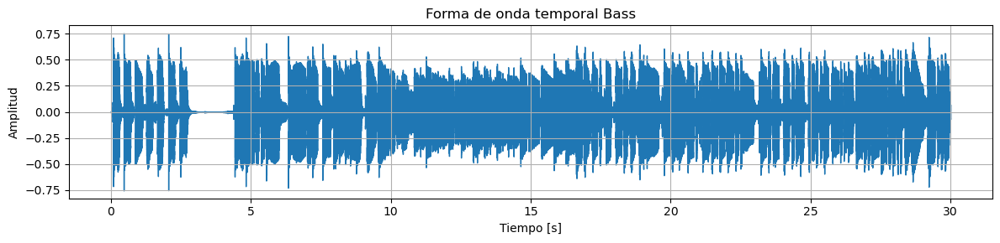

In [7]:
plt.figure(figsize=(12, 3))
librosa.display.waveshow(y_bass, sr=sr)
plt.title("Forma de onda temporal Bass")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.tight_layout()
plt.show()

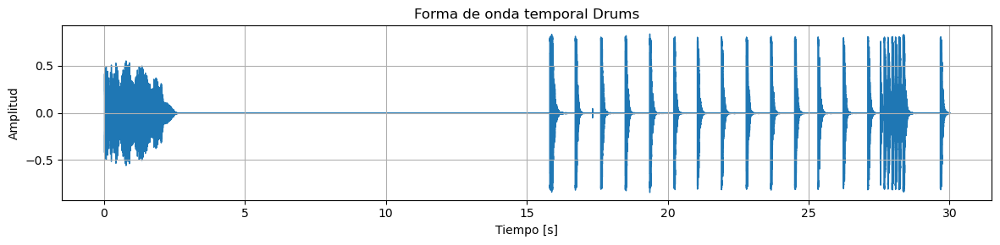

In [8]:
plt.figure(figsize=(12, 3))
librosa.display.waveshow(y_drums, sr=sr)
plt.title("Forma de onda temporal Drums")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.tight_layout()
plt.show()

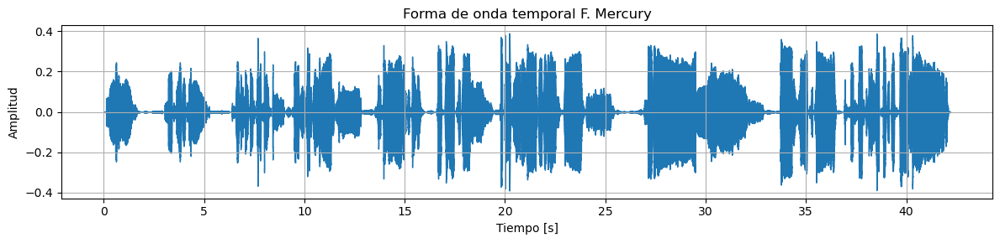

In [9]:
plt.figure(figsize=(12, 3))
librosa.display.waveshow(y_mercury, sr=sr)
plt.title("Forma de onda temporal F. Mercury")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.tight_layout()
plt.show()

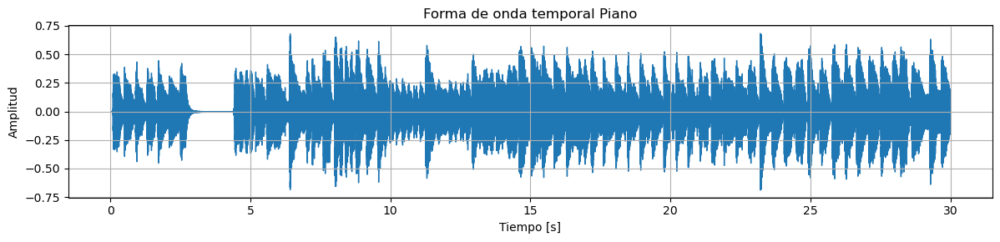

In [10]:
plt.figure(figsize=(12, 3))
librosa.display.waveshow(y_piano, sr=sr)
plt.title("Forma de onda temporal Piano")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.tight_layout()
plt.show()

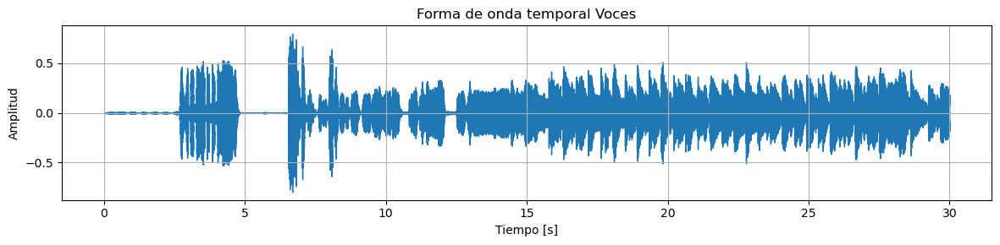

In [11]:
plt.figure(figsize=(12, 3))
librosa.display.waveshow(y_voces, sr=sr)
plt.title("Forma de onda temporal Voces")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.tight_layout()
plt.show()

In [12]:
display(Audio(y_bass, rate=sr))

In [13]:
display(Audio(y_drums, rate=sr))

In [14]:
display(Audio(y_mercury, rate=sr))

In [15]:
display(Audio(y_piano, rate=sr))

In [16]:
display(Audio(y_voces, rate=sr))

In [17]:
tracks = [y_bass, y_drums, y_mercury, y_piano, y_voces]  
sr = sr  

max_len = max(len(y) for y in tracks)
tracks_pad = [np.pad(y, (0, max_len - len(y))) for y in tracks]

# Opcional!!! 
gains = [1.0, 0.5, 1.0, 1.0, 1.0]
tracks_pad = [g*y for g, y in zip(gains, tracks_pad)]

y_mix = np.sum(tracks_pad, axis=0)

# Opcional!! Normalizar
peak = np.max(np.abs(y_mix))
if peak > 0:
    y_mix = 0.98 * y_mix / peak

sf.write("audios/queen_mix.wav", y_mix.astype(np.float32), sr)
Audio(y_mix, rate=sr)

In [18]:
# Correlación cruzada FFT para estimar lag (en muestras) ---
def estimate_lag(y, ref):
    
    def best_window(x, win=131072):  
        if len(x) <= win:
            return x
        hop = win // 4
        best_i, best_e = 0, -np.inf
        for i in range(0, len(x)-win+1, hop):
            e = np.sum(x[i:i+win]**2)
            if e > best_e:
                best_e, best_i = e, i
        return x[best_i:best_i+win]

    a = best_window(y.astype(np.float32))
    b = best_window(ref.astype(np.float32))
    n = int(1) << (len(a)+len(b)-1).bit_length()  

    # Rxy = ifft(FFT(a) * conj(FFT(b)))
    Fa = np.fft.rfft(a, n=n)
    Fb = np.fft.rfft(b, n=n)
    R = np.fft.irfft(Fa * np.conj(Fb), n=n)

    R = np.concatenate((R[-(len(b)-1):], R[:len(a)]))
    lags = np.arange(-(len(b)-1), len(a))
    lag = lags[np.argmax(R)]
    return int(lag)

def shift_by_lag(y, lag):
    
    if lag > 0:
        return np.pad(y, (lag, 0))
    elif lag < 0:
        cut = min(-lag, len(y))
        return y[cut:]
    else:
        return y


ref = y_drums  

tracks = [y_bass, y_drums, y_mercury, y_piano, y_voces]
names  = ["bass", "drums", "mercury", "piano", "voces"]

lags = [estimate_lag(y, ref) for y in tracks]
for n, lg in zip(names, lags):
    print(f"{n:8s}: lag = {lg:+d} muestras  ({lg/sr*1000:.1f} ms)")

tracks_aligned = [shift_by_lag(y, -lg)  
                  for y, lg in zip(tracks, lags)]

max_len = max(len(y) for y in tracks_aligned)
tracks_pad = [np.pad(y.astype(np.float32), (0, max_len - len(y))) for y in tracks_aligned]

gains = [1.0, 0.8, 1.0, 0.9, 1.0]
tracks_pad = [g*y for g, y in zip(gains, tracks_pad)]

y_mix = np.sum(tracks_pad, axis=0)
peak = np.max(np.abs(y_mix))
if peak > 0:
    y_mix = 0.98 * y_mix / peak

sf.write("audios/queen_mix_aligned.wav", y_mix.astype(np.float32), sr)

bass    : lag = -30251 muestras  (-1890.7 ms)
drums   : lag = +0 muestras  (0.0 ms)
mercury : lag = -105822 muestras  (-6613.9 ms)
piano   : lag = -26834 muestras  (-1677.1 ms)
voces   : lag = -34345 muestras  (-2146.6 ms)


In [19]:
y_mix2, sr = librosa.load("audios/queen_mix_aligned.wav", sr=None)

In [20]:
Audio(y_mix2, rate=sr)